In [1]:
import numpy as np
import pandas as pd
import datetime
import vectorbt as vbt
import seaborn as sns
import yfinance as yf

import requests
import apimoex
import matplotlib as plt
import plotly
import plotly.graph_objects as go

## 1 часть
Кущенко Валерия Павловна ВАД-1 

money – стартовое количество денежных единиц ( 100 000 )

start – дата старта временного интервала ( 2018-1-1 )

finish – дата финиша временного интервала ( 2018-12-31 )

stop_loss – в процентах (5%)

fast_window – размер быстрого скользящего окна (30 торговых свечей)

slow_window – размер медленного скользящего окна (90 торговых свечей) в окнах считаем простое скользящее среднее

In [2]:
money=100000
stop_loss=0.05
fast_window=30
slow_window=90

скачаем данные с мосбиржи, возьмем газпром (база)

In [3]:
start = datetime.datetime(2018, 1, 1)
end = datetime.datetime(2018, 12, 31)
with requests.Session() as session:
    data = apimoex.get_market_candles(session, 'GAZP', interval=60, start= start, end=end)
    df = pd.DataFrame(data)
    print(df.head(), '\n')
    df.set_index(pd.to_datetime(df['begin']), inplace=True)
    df.drop(['begin'], axis=1, inplace=True)
    print(df.head(), '\n')
    print(df.tail(), '\n')
    df.info()

                 begin    open   close    high     low        value   volume
0  2018-01-03 09:00:00  131.03  131.03  131.03  131.03    1552705.5    11850
1  2018-01-03 10:00:00  131.03  131.40  131.75  130.63  175724891.1  1340340
2  2018-01-03 11:00:00  131.35  131.21  131.87  131.20  329508677.7  2506980
3  2018-01-03 12:00:00  131.27  131.46  131.66  131.05   84143724.2   640520
4  2018-01-03 13:00:00  131.45  131.32  131.58  131.19   94575801.3   719870 

                       open   close    high     low        value   volume
begin                                                                    
2018-01-03 09:00:00  131.03  131.03  131.03  131.03    1552705.5    11850
2018-01-03 10:00:00  131.03  131.40  131.75  130.63  175724891.1  1340340
2018-01-03 11:00:00  131.35  131.21  131.87  131.20  329508677.7  2506980
2018-01-03 12:00:00  131.27  131.46  131.66  131.05   84143724.2   640520
2018-01-03 13:00:00  131.45  131.32  131.58  131.19   94575801.3   719870 

                

In [4]:
gazp=df
display(gazp.head(10))

,open,close,high,low,value,volume
begin,,,,,,
2018-01-03 09:00:00,131.03,131.03,131.03,131.03,1552705.5,11850
2018-01-03 10:00:00,131.03,131.40,131.75,130.63,175724891.1,1340340
2018-01-03 11:00:00,131.35,131.21,131.87,131.20,329508677.7,2506980
2018-01-03 12:00:00,131.27,131.46,131.66,131.05,84143724.2,640520
2018-01-03 13:00:00,131.45,131.32,131.58,131.19,94575801.3,719870
2018-01-03 14:00:00,131.32,131.01,131.60,130.92,86414697.6,658470
2018-01-03 15:00:00,131.01,130.99,131.17,130.67,93284907.7,712620
2018-01-03 16:00:00,131.00,131.55,131.75,130.96,130789644.4,994400
2018-01-03 17:00:00,131.57,131.61,131.75,131.45,91758205.2,697170


начинаем анализ - воспользуемся функциями библиотеки vectorbt для всех последующих действий. высчитаем короткие и длинные скользящие средние, рассчитаем время, в которое нужно входить/выходить с рынка (сигнал к покупке — быстрая скользящая пробивает долгую снизу-вверх, к продаже — если пересечение происходит сверху вниз). затем из всех дат выходов с рынка я укажу те, что были произведены с помощью стоп-лосса (сам стоп-лосс будет также использоваться в функции, чтобы вовремя выходить с рынка, но небольшие махинации я произвожу, чтобы вычислить сами даты стоп-лосса + затем указать их на графике черным цветом (другого метода не придумала) )

In [5]:
ma_fast = vbt.MA.run(gazp['close'], fast_window)
ma_slow = vbt.MA.run(gazp['close'], slow_window)

In [6]:
entries = ma_fast.ma_crossed_above(ma_slow)
exits   = ma_fast.ma_crossed_below(ma_slow)
display(entries[entries==True])
display(exits[exits==True])

begin
2018-02-20 12:00:00    True
2018-03-14 09:00:00    True
2018-03-20 18:00:00    True
2018-03-27 17:00:00    True
2018-03-30 09:00:00    True
2018-04-12 13:00:00    True
2018-05-10 15:00:00    True
2018-06-04 18:00:00    True
2018-06-27 09:00:00    True
2018-07-30 18:00:00    True
2018-08-22 18:00:00    True
2018-11-02 15:00:00    True
2018-11-19 16:00:00    True
2018-11-28 18:00:00    True
2018-12-28 17:00:00    True
dtype: bool

begin
2018-01-29 14:00:00    True
2018-03-02 13:00:00    True
2018-03-16 11:00:00    True
2018-03-27 11:00:00    True
2018-03-28 16:00:00    True
2018-04-04 17:00:00    True
2018-05-04 17:00:00    True
2018-05-21 15:00:00    True
2018-06-09 18:00:00    True
2018-07-18 11:00:00    True
2018-08-15 14:00:00    True
2018-10-12 11:00:00    True
2018-11-13 09:00:00    True
2018-11-26 10:00:00    True
2018-12-10 11:00:00    True
dtype: bool

In [7]:
pf = vbt.Portfolio.from_signals(gazp['close'], entries, exits,sl_stop=stop_loss,init_cash=money)
res=pf.positions.records_readable
stop_signal_dates=res[res['Return']<(-1)*stop_loss]['Exit Timestamp']
stop_signal_values=df['close'][stop_signal_dates]                                        #обозначаю стоп-лоссы
display(res)                                                                             # данные по открытиям-закрытиям за период

,Position Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status
0,0,0,705.119165,2018-02-20 12:00:00,141.82,0.0,2018-03-02 13:00:00,138.06,0.0,-2651.248061,-0.026512,Long,Closed
1,1,0,686.424707,2018-03-14 09:00:00,141.82,0.0,2018-03-16 11:00:00,137.86,0.0,-2718.241840,-0.027923,Long,Closed
2,2,0,664.306845,2018-03-20 18:00:00,142.45,0.0,2018-03-27 11:00:00,139.62,0.0,-1879.988372,-0.019867,Long,Closed
3,3,0,655.341777,2018-03-27 17:00:00,141.53,0.0,2018-03-28 16:00:00,140.82,0.0,-465.292662,-0.005017,Long,Closed
4,4,0,645.351252,2018-03-30 09:00:00,143.00,0.0,2018-04-04 17:00:00,139.71,0.0,-2123.205620,-0.023007,Long,Closed
5,5,0,626.125163,2018-04-12 13:00:00,144.00,0.0,2018-05-04 17:00:00,143.53,0.0,-294.278827,-0.003264,Long,Closed
6,6,0,613.473579,2018-05-10 15:00:00,146.49,0.0,2018-05-21 15:00:00,147.65,0.0,711.629352,0.007919,Long,Closed
7,7,0,618.542570,2018-06-04 18:00:00,146.44,0.0,2018-06-09 18:00:00,144.08,0.0,-1459.760466,-0.016116,Long,Closed
8,8,0,645.747507,2018-06-27 09:00:00,138.01,0.0,2018-07-18 11:00:00,138.07,0.0,38.744850,0.000435,Long,Closed
9,9,0,641.888829,2018-07-30 18:00:00,138.90,0.0,2018-08-15 14:00:00,140.69,0.0,1148.981004,0.012887,Long,Closed


немного визуализации: (в данном случае стоп-лоссов нет, тк не было сильных просадок (из статистики далее - макс просадка в 4%, а стоп-лосс на 5)

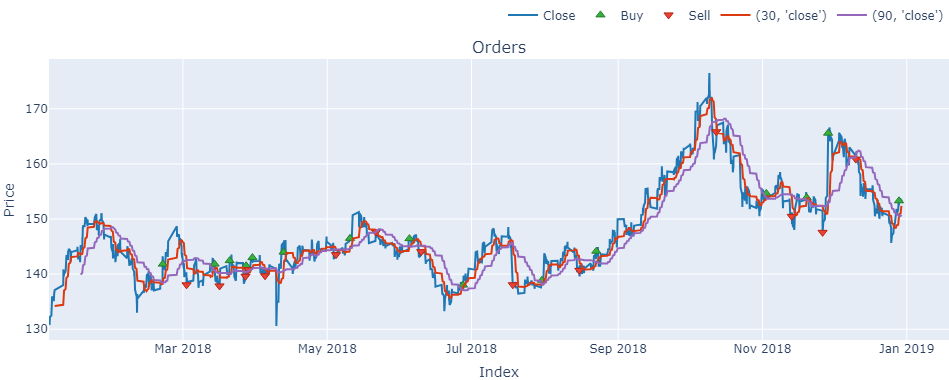

In [8]:
fig = pf.plot('orders')
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":1})
fig=ma_fast.ma.vbt.plot(fig=fig)
fig=ma_slow.ma.vbt.plot(fig=fig)
fig.add_trace(go.Scatter(x=np.array(stop_signal_dates), y=stop_signal_values, mode='markers', 
    marker=dict(symbol='triangle-down', color='black', size=9),name='stop signal'
))

fig.show()

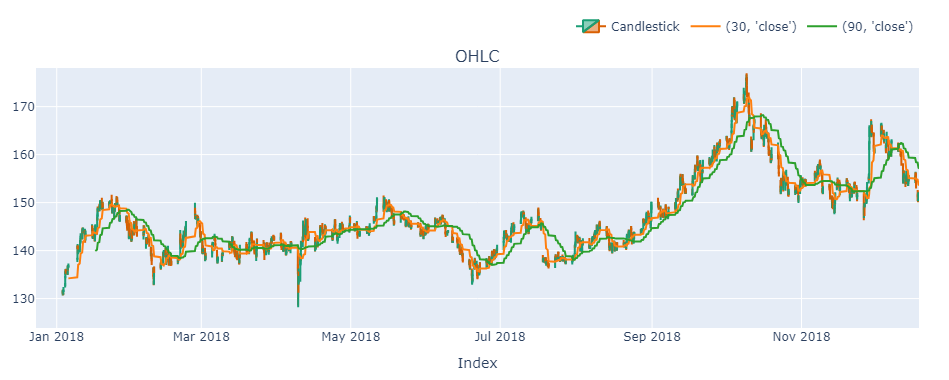

In [9]:
my_column_names = dict(
    open='open',
    high='high',
    low='low',
    close='close',
    volume='volume'
)
ohlcv_acc=gazp.vbt.ohlcv(column_names=my_column_names)
fig = ohlcv_acc.plots(settings=dict(plot_type='candlestick'))
fig=ma_fast.ma.vbt.plot(fig=fig)
fig=ma_slow.ma.vbt.plot(fig=fig)

fig.show()

график кэш/активы (не 1 и 0, как просилось в задании, а более конкретно в числах)

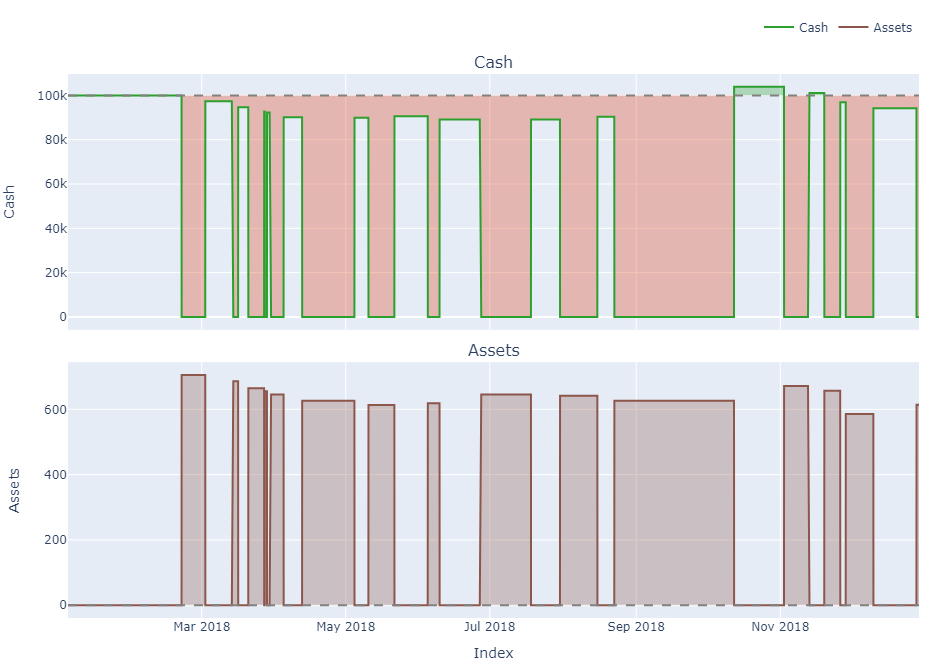

In [10]:
pf.plot(subplots=['cash', 'assets']).show()

In [11]:
display(pf.stats())
#  коэффициент шарпа ну ооочень хотел посчитаться.. но не смог.. (у них даже в документации вылезает эта ошибка -_- из-за отсутсвия частоты, не поняла, как исправить)

C:\Users\val04\anaconda3\Lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'sharpe_ratio' requires frequency to be set

C:\Users\val04\anaconda3\Lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'calmar_ratio' requires frequency to be set

C:\Users\val04\anaconda3\Lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'omega_ratio' requires frequency to be set

C:\Users\val04\anaconda3\Lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'sortino_ratio' requires frequency to be set



Start                         2018-01-03 09:00:00
End                           2018-12-29 18:00:00
Period                                       2540
Start Value                              100000.0
End Value                            94295.838619
Total Return [%]                        -5.704161
Benchmark Return [%]                    17.148745
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                        16.386242
Max Drawdown Duration                      1552.0
Total Trades                                   15
Total Closed Trades                            14
Total Open Trades                               1
Open Trade PnL                         122.861028
Win Rate [%]                            28.571429
Best Trade [%]                          15.031909
Worst Trade [%]                         -4.106563
Avg Winning Trade [%]                    4.288986
Avg Losing Trade [%]                    -2.181803


итог:

In [12]:
prib=pf.total_profit()
print(f'Прибыль от акции, полученная по размерам окон {fast_window} и {slow_window} = {prib} ')

Прибыль от акции, полученная по размерам окон 30 и 90 = -5704.161380556921 


## 2 часть

а теперь найдем оптимальные размеры окон. далеко ходить не будем - построим тепловую карту, в которой будут рассчитаны комбинации разных окон от 2 до 100.
окно в 1 день я решила не брать - слишком большое читерство. после того, как вывели карту, найдем максимальный коэффициент ретерна, из его индексов - 
сами размеры оптимальных окон. затем окна подставляем в встроенную функцию векторабт, чтобы рассчитать прибыль.  +пара графиков для визуализации оптимального варианта

C:\Users\val04\anaconda3\Lib\site-packages\jupyter_client\session.py:718: UserWarning:

Message serialization failed with:
Out of range float values are not JSON compliant
Supporting this message is deprecated in jupyter-client 7, please make sure your message is JSON-compliant



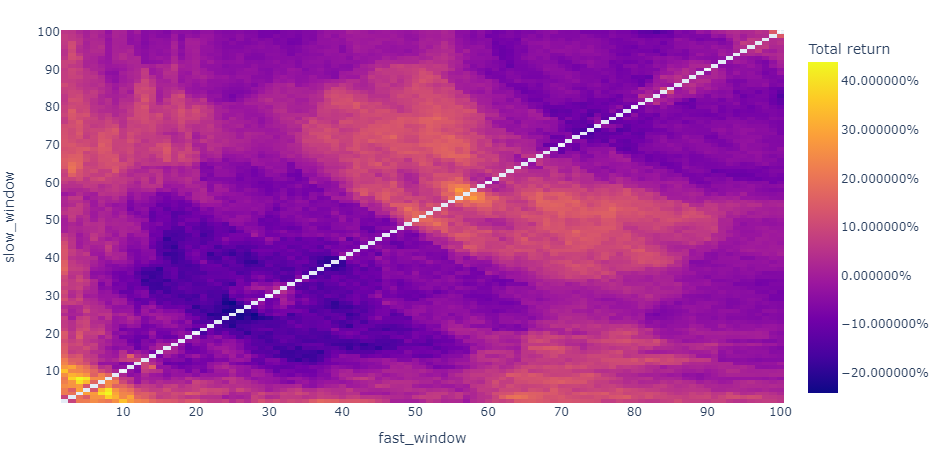

In [13]:
windows = np.arange(2, 101)
fast_ma, slow_ma = vbt.MA.run_combs(gazp['close'], window=windows, r=2, short_names=['fast', 'slow'])
entries = fast_ma.ma_crossed_above(slow_ma)
exits = fast_ma.ma_crossed_below(slow_ma)
pf_kwargs = dict(size=np.inf)
pf = vbt.Portfolio.from_signals(gazp['close'], entries, exits,sl_stop=stop_loss, **pf_kwargs)

fig = pf.total_return().vbt.heatmap(x_level='fast_window', y_level='slow_window', symmetric=True,trace_kwargs=dict(colorbar=dict(title='Total return', tickformat='%')))
fig.show()

In [14]:
vse=pf.total_return()
display(vse)

fast_window  slow_window
2            3              0.088586
             4              0.215199
             5              0.219219
             6              0.249659
             7              0.223854
                              ...   
97           99             0.031570
             100            0.047714
98           99             0.033055
             100            0.039154
99           100            0.144042
Name: total_return, Length: 4851, dtype: float64

In [15]:
# vse.idxmax()
vse[vse==vse.max()]

fast_window  slow_window
4            8              0.440016
Name: total_return, dtype: float64

итог поиска оптимальных окон (подсчет прибыли и визуализация)

In [16]:
okna=vse.idxmax()
fast_opt=okna[0]
slow_opt=okna[1]
ma_fast_opt = vbt.MA.run(gazp['close'], fast_opt)
ma_slow_opt = vbt.MA.run(gazp['close'], slow_opt)
entries_opt = ma_fast_opt.ma_crossed_above(ma_slow_opt)
exits_opt   = ma_fast_opt.ma_crossed_below(ma_slow_opt)
pf_opt = vbt.Portfolio.from_signals(gazp['close'], entries_opt, exits_opt,sl_stop=stop_loss,init_cash=money)
profit_opt=pf_opt.total_profit()
print(f"Самую высокую прибыль от акций в размере {profit_opt} возможно получить \
при оптимальном выборе скользящих окон: размер \
быстрого скользящего окна должен составлять {fast_opt}, \
размер медленного скользящего окна должен составлять {slow_opt}")

Самую высокую прибыль от акций в размере 44001.63706960606 возможно получить при оптимальном выборе скользящих окон: размер быстрого скользящего окна должен составлять 4, размер медленного скользящего окна должен составлять 8


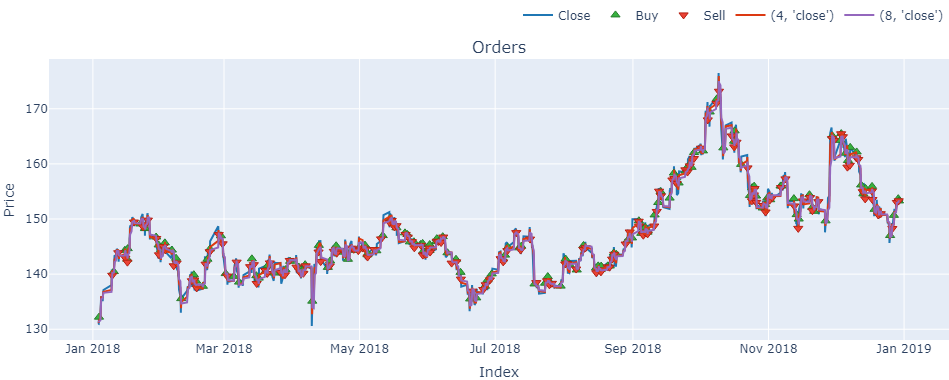

In [17]:
res=pf_opt.positions.records_readable
stop_signal_dates=res[res['Return']<(-1)*stop_loss]['Exit Timestamp']
stop_signal_values=df['close'][stop_signal_dates] 
fig = pf_opt.plot('orders')
fig.update_layout(margin={"r":0,"t":30,"l":0,"b":1})
fig=ma_fast_opt.ma.vbt.plot(fig=fig)
fig=ma_slow_opt.ma.vbt.plot(fig=fig)
fig.add_trace(go.Scatter(x=np.array(stop_signal_dates), y=stop_signal_values, mode='markers', 
    marker=dict(symbol='triangle-down', color='black', size=9),name='stop signal'
))

fig.show()

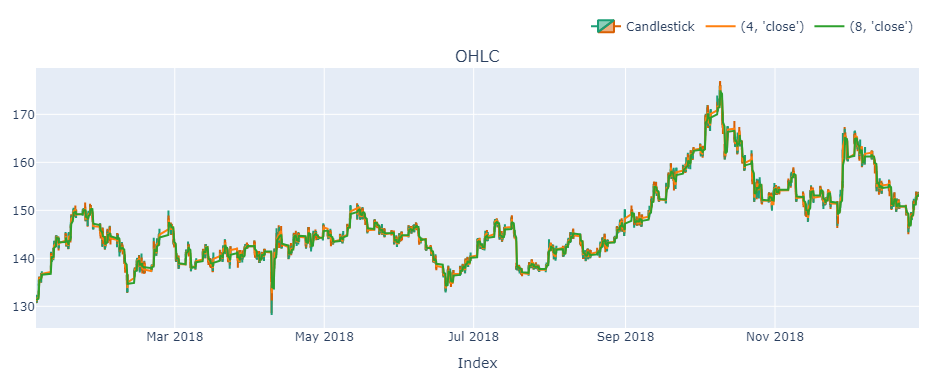

In [18]:
ohlcv_acc=gazp.vbt.ohlcv(column_names=my_column_names)
fig = ohlcv_acc.plots(settings=dict(plot_type='candlestick'))
fig=ma_fast_opt.ma.vbt.plot(fig=fig)
fig=ma_slow_opt.ma.vbt.plot(fig=fig)

fig.show()

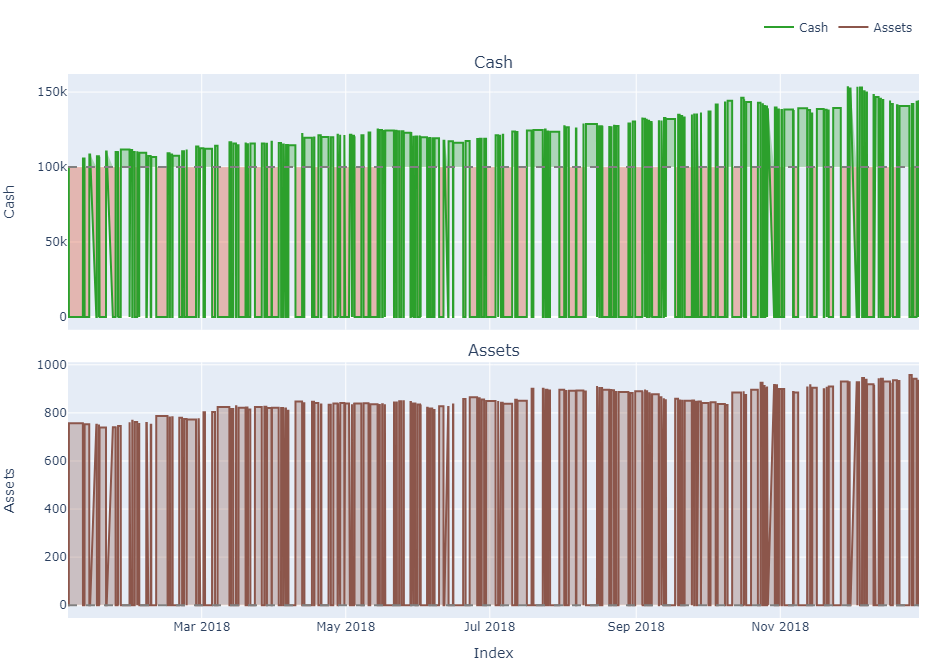

In [19]:
pf_opt.plot(subplots=['cash', 'assets']).show()

In [20]:
display(pf_opt.stats())

C:\Users\val04\anaconda3\Lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'sharpe_ratio' requires frequency to be set

C:\Users\val04\anaconda3\Lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'calmar_ratio' requires frequency to be set

C:\Users\val04\anaconda3\Lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'omega_ratio' requires frequency to be set

C:\Users\val04\anaconda3\Lib\site-packages\vectorbt\generic\stats_builder.py:396: UserWarning:

Metric 'sortino_ratio' requires frequency to be set



Start                         2018-01-03 09:00:00
End                           2018-12-29 18:00:00
Period                                       2540
Start Value                              100000.0
End Value                            144001.63707
Total Return [%]                        44.001637
Benchmark Return [%]                    17.148745
Max Gross Exposure [%]                      100.0
Total Fees Paid                               0.0
Max Drawdown [%]                          9.53186
Max Drawdown Duration                       563.0
Total Trades                                  158
Total Closed Trades                           157
Total Open Trades                               1
Open Trade PnL                         206.386711
Win Rate [%]                            41.401274
Best Trade [%]                           9.975279
Worst Trade [%]                         -2.031401
Avg Winning Trade [%]                    1.421812
Avg Losing Trade [%]                    -0.591241


и отчет по сделкам для оптимальных окон:

In [21]:
display(pf_opt.positions.records_readable)

,Position Id,Column,Size,Entry Timestamp,Avg Entry Price,Entry Fees,Exit Timestamp,Avg Exit Price,Exit Fees,PnL,Return,Direction,Status
0,0,0,756.429652,2018-01-03 18:00:00,132.20,0.0,2018-01-09 17:00:00,139.79,0.0,5741.301059,0.057413,Long,Closed
1,1,0,752.821451,2018-01-10 10:00:00,140.46,0.0,2018-01-12 10:00:00,143.88,0.0,2574.649364,0.024349,Long,Closed
2,2,0,750.526264,2018-01-15 09:00:00,144.32,0.0,2018-01-15 15:00:00,142.90,0.0,-1065.747295,-0.009839,Long,Closed
3,3,0,751.578158,2018-01-16 12:00:00,142.70,0.0,2018-01-16 13:00:00,142.17,0.0,-398.336424,-0.003714,Long,Closed
4,4,0,738.794626,2018-01-16 16:00:00,144.63,0.0,2018-01-19 12:00:00,149.45,0.0,3560.990096,0.033326,Long,Closed
...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,153,0,932.427465,2018-12-20 16:00:00,151.34,0.0,2018-12-21 12:00:00,150.96,0.0,-354.322437,-0.002511,Long,Closed
154,154,0,957.480784,2018-12-25 17:00:00,147.01,0.0,2018-12-26 17:00:00,148.27,0.0,1206.425788,0.008571,Long,Closed
155,155,0,942.229216,2018-12-27 10:00:00,150.67,0.0,2018-12-28 18:00:00,153.00,0.0,2195.394072,0.015464,Long,Closed
156,156,0,937.999024,2018-12-29 09:00:00,153.69,0.0,2018-12-29 14:00:00,153.30,0.0,-365.819619,-0.002538,Long,Closed
